<a href="https://colab.research.google.com/github/NataliaShchegl0va/Capstone-3-Uber-Rides/blob/main/01_Data_Wrangling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predicting customer footfall for taxi service by day and hour: Data Wrangling
My data contains:
- 12 parquet files with trips data (each file has 1 month worth of data, ~12mln rows);
- shapefile with geometry of each taxi zone;
- csv taxi zones lookup file (zone id, zone name and borough where zone is located);
- csv file with daily records for weather in New York.

In this stage of the project I will:
- audit my data quality,
- aggregate trips data into one dataframe with hourly information about taxi services demand in each zone,
- add weather info to aggregated file,
- add zones geometry info to aggregated file,
- and do some feature engineering.

In [3]:
# Installing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import gcsfs
from google.colab import auth
auth.authenticate_user()

In [ ]:
# !pip install ydata_profiling

In [19]:
from ydata_profiling import ProfileReport

In [ ]:
# Reading the file sample from Google Cloud Storage
gcs_path = 'gs://dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-01.parquet'
trips = pd.read_parquet(gcs_path, storage_options={'token': 'cloud'})


In [ ]:
trips.head()

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,HV0003,B02682,B02682,2021-01-01 00:28:09,2021-01-01 00:31:42,2021-01-01 00:33:44,2021-01-01 00:49:07,230,166,5.26,...,1.98,2.75,NaN,0.00,14.99,N,N,,N,N
1,HV0003,B02682,B02682,2021-01-01 00:45:56,2021-01-01 00:55:19,2021-01-01 00:55:19,2021-01-01 01:18:21,152,167,3.65,...,1.63,0.00,NaN,0.00,17.06,N,N,,N,N
2,HV0003,B02764,B02764,2021-01-01 00:21:15,2021-01-01 00:22:41,2021-01-01 00:23:56,2021-01-01 00:38:05,233,142,3.51,...,1.25,2.75,NaN,0.94,12.98,N,N,,N,N
3,HV0003,B02764,B02764,2021-01-01 00:39:12,2021-01-01 00:42:37,2021-01-01 00:42:51,2021-01-01 00:45:50,142,143,0.74,...,0.70,2.75,NaN,0.00,7.41,N,N,,N,N
4,HV0003,B02764,B02764,2021-01-01 00:46:11,2021-01-01 00:47:17,2021-01-01 00:48:14,2021-01-01 01:08:42,143,78,9.20,...,2.41,2.75,NaN,0.00,22.44,N,N,,N,N


In [ ]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11908468 entries, 0 to 11908467
Data columns (total 24 columns):
 #   Column                Dtype         
---  ------                -----         
 0   hvfhs_license_num     object        
 1   dispatching_base_num  object        
 2   originating_base_num  object        
 3   request_datetime      datetime64[us]
 4   on_scene_datetime     datetime64[us]
 5   pickup_datetime       datetime64[us]
 6   dropoff_datetime      datetime64[us]
 7   PULocationID          int64         
 8   DOLocationID          int64         
 9   trip_miles            float64       
 10  trip_time             int64         
 11  base_passenger_fare   float64       
 12  tolls                 float64       
 13  bcf                   float64       
 14  sales_tax             float64       
 15  congestion_surcharge  float64       
 16  airport_fee           float64       
 17  tips                  float64       
 18  driver_pay            float64       
 19

In [ ]:
# Profiling data to check for duplicates, null values and other data quality issues in my sample file.
# profile = ProfileReport(trips, title="Merged Data Profiling Report")
# profile

## **Observations:**
1. Originating base number has a lot of missing values - will need to investigate during EDA.
2. Request datetime - can be used to engineer more features (day, hour, minute, time_of_day, time_of month, day_of_week, public_holiday). 4 records are missing request datetime.
3. On-scene datetime has a lot of missing values - will need to investigate during EDA.
4. Pickup datetime can be used to calculate passenger wait time between request and pickup. Ideally, on-scene datetime column should be used to calculate passenger wait time, but ~27% of on-scene datetime values are missing, hence why I will use pickup time as a reasonable proxy.
5. PULocationID can be joined with taxi_zone lookup and taxi_zones geometry files for data exploration during EDA stage.
6. Trip_miles and trip_time have some outliers and also 0 values, will need to explore during EDA.
7. Base passenger fare has negative values - will need to investigate.
8. Airport fee is always 0 for Jan file.
9. Driver pay has negative values - will need to investigate.
10. Trips data can be joined with weather data on date.
11. I need to calculate an aggregated dataframe of a demand in every taxi zone for every date and hour. The columns that may be useful: request date, request hour, pickup zone, average wait time, congestion surcharge. In Jan trips data there are 4 records with null values for request datetime. Having nulls does not affect averages calculation, but since avg wait time is one of the columns I want to use to infer footfall, I will check how many missing values we have in the rest of the monthly trips files.  


In [ ]:
# Checking null value cases for request_datetime
trips[trips['request_datetime'].isnull()==True]

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
278101,HV0004,B02800,None,NaT,NaT,2021-01-01 16:14:16,2021-01-01 16:14:33,75,162,0.00,...,1.35,0.00,NaN,0.0,0.00,Y,N,N,N,N
5931867,HV0004,B02800,None,NaT,NaT,2021-01-17 00:06:41,2021-01-17 00:11:40,47,69,0.57,...,0.88,0.00,NaN,0.0,3.14,Y,N,N,N,N
10340873,HV0004,B02800,None,NaT,NaT,2021-01-28 14:10:05,2021-01-28 14:12:16,162,50,1.55,...,1.42,2.75,NaN,0.0,0.00,Y,N,N,N,Y
10740436,HV0004,B02800,None,NaT,NaT,2021-01-29 12:54:33,2021-01-29 13:16:13,134,260,9.33,...,2.09,0.00,NaN,0.0,20.03,Y,N,N,N,N


In [ ]:
# Do we have cases where pickup time is before request time?
anomalies = trips[trips['request_datetime']>trips['pickup_datetime']]
anomalies.head()

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
541,HV0005,B02510,None,2021-01-01 00:45:00,NaT,2021-01-01 00:29:39,2021-01-01 00:51:44,261,143,5.644,...,1.76,2.75,NaN,0.0,17.36,N,N,N,N,N
1000,HV0005,B02510,None,2021-01-01 00:45:00,NaT,2021-01-01 00:30:39,2021-01-01 00:50:04,116,60,6.459,...,1.96,0.00,NaN,0.0,16.93,N,N,N,N,N
1657,HV0005,B02510,None,2021-01-01 00:45:00,NaT,2021-01-01 00:39:27,2021-01-01 00:55:21,78,265,6.423,...,1.90,0.00,NaN,0.0,15.76,N,N,N,N,N
2096,HV0005,B02510,None,2021-01-01 00:55:00,NaT,2021-01-01 00:48:21,2021-01-01 00:54:48,241,153,0.774,...,0.44,0.00,NaN,0.0,5.47,N,N,N,N,N
2102,HV0005,B02510,None,2021-01-01 00:15:00,NaT,2021-01-01 00:01:36,2021-01-01 00:31:48,151,167,7.348,...,2.89,0.00,NaN,0.0,23.33,N,N,N,N,N


In [ ]:
anomalies.groupby('hvfhs_license_num').size()

,0
hvfhs_license_num,
HV0003,3549
HV0005,10404


In [ ]:
# Getting files for all months from Cloud Storage
fs = gcsfs.GCSFileSystem()
bucket_name = 'dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88'
bucket_path = f'gs://{bucket_name}/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips'

file_list = fs.glob(f'{bucket_path}/*.parquet')
print(file_list)

['dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-01.parquet', 'dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-02.parquet', 'dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-03.parquet', 'dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-04.parquet', 'dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-05.parquet', 'dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-06.parquet', 'dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-07.parquet', 'data

In [ ]:
# Aggregating trips data by date and hour, filtering for Uber only, doing basic data transformations and concatenating all monthly trips files.
trips_data = []
for file in file_list:
  df = pd.read_parquet(file, filesystem=fs)
  # df['business_name'] = df['hvfhs_license_num'].map({'HV0002':'Juno','HV0003':'Uber','HV0004':'Via', 'HV0005':'Lyft'}).values
  df = df[df['hvfhs_license_num']=='HV0003']  # selecting only Uber trips
  df.drop_duplicates(inplace=True)
  df['request_date'] = pd.to_datetime(df['request_datetime']).dt.date
  df['request_date'] = pd.to_datetime(df['request_date'])
  anomalies = df[df['request_datetime']>df['pickup_datetime']]
  anomalies_cnt = (df['request_datetime'] > df['pickup_datetime']).sum()
  request_nulls = df['request_datetime'].isnull().sum()
  pickup_nulls = df['pickup_datetime'].isnull().sum()
  print(f"{file} has {request_nulls} null values in 'request datetime', {pickup_nulls} in 'pickup_datetime' columns, and {anomalies_cnt} anomalies")
  df['passenger_wait_time'] = np.where(
    df['request_datetime'] <= df['pickup_datetime'],
    (pd.to_datetime(df['pickup_datetime']) - pd.to_datetime(df['request_datetime'])).dt.total_seconds(),
    np.nan)
  df['request_hour'] = pd.to_datetime(df['request_datetime']).dt.hour
  df['passenger_count'] = 1
  df_agg = df.groupby(['request_date','request_hour','hvfhs_license_num','PULocationID']).agg({'passenger_count':'sum','passenger_wait_time':'mean','congestion_surcharge':'mean'}).reset_index()
  df_agg['passenger_wait_time'] = df_agg['passenger_wait_time']/60  # transforming seconds to minutes
  df_agg.rename(columns={'passenger_wait_time':'avg_passenger_wait_time','congestion_surcharge':'avg_congestion_surcharge'},inplace=True)
  trips_data.append(df_agg)

trips_data = pd.concat(trips_data,ignore_index=True)

dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-01.parquet has 0 null values in 'request datetime', 0 in 'pickup_datetime' columns, and 3549 anomalies
dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-02.parquet has 0 null values in 'request datetime', 0 in 'pickup_datetime' columns, and 8520 anomalies
dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-03.parquet has 0 null values in 'request datetime', 0 in 'pickup_datetime' columns, and 8535 anomalies
dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips/tripdata_2021-04.parquet has 0 null values in 'request datetime', 0 in 'pickup_datetime' columns, and 12076 anomalies
dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@

Starting in August, the number of records with anomalies (where pickup time is before request time) becomes quite sizeable - 100K+. I'll try to investigate these cases in my EDA. I don't want to drop these records, because even though wait time will be null for these cases, they still provide important information about the demand - they indicate the number of customers who requested Uber. Also, each month has few milions of records, 200K of anomaly records constitute just 5% of total records.

In [ ]:
# Saving output file in Cloud Storage for easy access in future
output_path = 'gs://dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/uber_trips_initial.csv'
trips_data.to_csv(output_path, storage_options={"token": "cloud"}, index=False)

In [4]:
# Reading aggregated trips data file from Google Cloud Storage
# trips_path = 'gs://dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/uber_trips_initial.csv'
# trips_data = pd.read_csv(trips_path, storage_options={'token': 'cloud'})

In [ ]:
trips_data.head()

,request_date,request_hour,hvfhs_license_num,PULocationID,passenger_count,avg_passenger_wait_time,avg_congestion_surcharge
0,2020-12-31,23,HV0003,3,1,5.566667,0.000000
1,2020-12-31,23,HV0003,9,1,3.883333,0.000000
2,2020-12-31,23,HV0003,10,3,3.916667,0.000000
3,2020-12-31,23,HV0003,14,2,4.925000,0.000000
4,2020-12-31,23,HV0003,17,7,4.419048,0.392857


In [5]:
trips_data.groupby('request_date').size()

,0
request_date,
2020-12-31,159
2021-01-01,5947
2021-01-02,5913
2021-01-03,5864
2021-01-04,5875
...,...
2021-12-27,5951
2021-12-28,5946
2021-12-29,5936


In [6]:
trips_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2180485 entries, 0 to 2180484
Data columns (total 7 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   request_date              object 
 1   request_hour              int64  
 2   hvfhs_license_num         object 
 3   PULocationID              int64  
 4   passenger_count           int64  
 5   avg_passenger_wait_time   float64
 6   avg_congestion_surcharge  float64
dtypes: float64(2), int64(3), object(2)
memory usage: 116.5+ MB


In [ ]:
trips_data.describe()

,request_date,request_hour,PULocationID,passenger_count,avg_passenger_wait_time,avg_congestion_surcharge
count,2180485,2.180485e+06,2.180485e+06,2.180485e+06,2.179733e+06,2.180485e+06
mean,2021-07-02 05:20:12.314324224,1.161591e+01,1.343249e+02,5.784448e+01,5.614597e+00,7.144765e-01
min,2020-12-31 00:00:00,0.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,2021-04-02 00:00:00,6.000000e+00,6.800000e+01,1.500000e+01,4.160000e+00,1.666667e-02
50%,2021-07-02 00:00:00,1.200000e+01,1.360000e+02,3.900000e+01,5.183333e+00,2.037037e-01
75%,2021-10-01 00:00:00,1.800000e+01,2.010000e+02,8.200000e+01,6.573432e+00,8.870968e-01
max,2021-12-31 00:00:00,2.300000e+01,2.650000e+02,1.646000e+03,6.639500e+02,2.750000e+00
std,NaN,6.902780e+00,7.578789e+01,6.061259e+01,2.285201e+00,9.876393e-01


In [7]:
# exploring weather data
weather_path = 'gs://dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/nyc_weather.csv'
weather = pd.read_csv(weather_path, storage_options={'token': 'cloud'})
weather.head()

,name,address,resolvedAddress,datetime,temp,feelslike,dew,humidity,precip,precipprob,...,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,uvindex,severerisk
0,nyc,nyc,"New York, NY, United States",2021-01-01,2.5,-0.2,-3.0,67.8,15.33,100,...,0.0,0.0,NaN,15.5,69.8,1028.9,50.6,14.0,3,NaN
1,nyc,nyc,"New York, NY, United States",2021-01-02,5.8,3.6,1.2,74.0,2.38,100,...,1.9,0.6,54.6,25.5,246.9,1012.4,63.9,12.2,5,NaN
2,nyc,nyc,"New York, NY, United States",2021-01-03,2.5,-1.6,-0.5,80.7,5.09,100,...,1.2,1.7,42.2,24.1,66.4,1017.0,81.5,13.2,1,NaN
3,nyc,nyc,"New York, NY, United States",2021-01-04,3.6,1.1,-0.2,76.6,0.84,100,...,0.5,0.7,NaN,17.3,141.1,1014.6,89.3,15.6,4,NaN
4,nyc,nyc,"New York, NY, United States",2021-01-05,3.8,1.3,-1.5,68.7,0.00,0,...,0.0,0.1,31.7,15.2,124.4,1013.1,98.8,16.0,2,NaN


In [ ]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              365 non-null    object 
 1   address           365 non-null    object 
 2   resolvedAddress   365 non-null    object 
 3   datetime          365 non-null    object 
 4   temp              365 non-null    float64
 5   feelslike         365 non-null    float64
 6   dew               365 non-null    float64
 7   humidity          365 non-null    float64
 8   precip            365 non-null    float64
 9   precipprob        365 non-null    int64  
 10  preciptype        152 non-null    object 
 11  snow              365 non-null    float64
 12  snowdepth         365 non-null    float64
 13  windgust          292 non-null    float64
 14  windspeed         365 non-null    float64
 15  winddir           365 non-null    float64
 16  sealevelpressure  365 non-null    float64
 1

In [8]:
weather[weather['precip']==0]['preciptype'].unique()

array([nan], dtype=object)

In [9]:
weather.groupby(['preciptype']).size()

,0
preciptype,
rain,132
"rain,snow",17
snow,3


In [10]:
# Selecting and transforming weather features which I want to add to trips dataframe
weather_filtered = weather.loc[:,['datetime','temp','precip','preciptype']]
weather_filtered['rain'] = weather_filtered['preciptype'].apply(lambda x: 1 if 'rain' in str(x) else 0)
weather_filtered['snow'] = weather_filtered['preciptype'].apply(lambda x: 1 if 'snow' in str(x) else 0)
weather_filtered.drop(columns=['preciptype'],inplace=True)
weather_filtered.head()

,datetime,temp,precip,rain,snow
0,2021-01-01,2.5,15.33,1,0
1,2021-01-02,5.8,2.38,1,0
2,2021-01-03,2.5,5.09,1,1
3,2021-01-04,3.6,0.84,1,1
4,2021-01-05,3.8,0.00,0,0


In [11]:
weather_filtered['datetime'] = pd.to_datetime(weather_filtered['datetime'])
weather_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   datetime  365 non-null    datetime64[ns]
 1   temp      365 non-null    float64       
 2   precip    365 non-null    float64       
 3   rain      365 non-null    int64         
 4   snow      365 non-null    int64         
dtypes: datetime64[ns](1), float64(2), int64(2)
memory usage: 14.4 KB


In [12]:
# Adding weather data to aggregated trips data
trips_data['request_date'] = pd.to_datetime(trips_data['request_date'])
trips_data = trips_data[trips_data['request_date']>='2021-01-01'].merge(weather_filtered,left_on='request_date',right_on='datetime',how='left')
trips_data.drop(columns=['datetime'],inplace=True)
trips_data.head()

,request_date,request_hour,hvfhs_license_num,PULocationID,passenger_count,avg_passenger_wait_time,avg_congestion_surcharge,temp,precip,rain,snow
0,2021-01-01,0,HV0003,3,68,6.790931,0.080882,2.5,15.33,1,0
1,2021-01-01,0,HV0003,4,100,4.221833,2.722500,2.5,15.33,1,0
2,2021-01-01,0,HV0003,5,14,10.142857,0.000000,2.5,15.33,1,0
3,2021-01-01,0,HV0003,6,18,7.538889,0.152778,2.5,15.33,1,0
4,2021-01-01,0,HV0003,7,195,3.579316,0.394872,2.5,15.33,1,0


In [13]:
# Adding taxi zones geometry
zones_path = 'gs://dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/taxi_zones.shx'
taxi_zones = gpd.read_file(zones_path, storage_options={'token': 'cloud'})
taxi_zones.head()

/usr/local/lib/python3.10/dist-packages/pyogrio/raw.py:196: RuntimeWarning: driver ESRI Shapefile does not support open option STORAGE_OPTIONS
  return ogr_read(


,geometry
0,"POLYGON ((933100.918 192536.086, 933091.011 19..."
1,"MULTIPOLYGON (((1033269.244 172126.008, 103343..."
2,"POLYGON ((1026308.77 256767.698, 1026495.593 2..."
3,"POLYGON ((992073.467 203714.076, 992068.667 20..."
4,"POLYGON ((935843.31 144283.336, 936046.565 144..."


In [ ]:
taxi_zones.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  263 non-null    geometry
dtypes: geometry(1)
memory usage: 2.2 KB


In [14]:
# Reading taxi zones lookup file
zones_path2 = 'gs://dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/taxi_zone_lookup.csv'
taxi_zones2 = pd.read_csv(zones_path2, storage_options={'token': 'cloud'})
taxi_zones2.head()

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [15]:
taxi_zones = taxi_zones2.merge(taxi_zones,left_index=True,right_index=True,how='left')
taxi_zones.head()

,LocationID,Borough,Zone,service_zone,geometry
0,1,EWR,Newark Airport,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19..."
1,2,Queens,Jamaica Bay,Boro Zone,"MULTIPOLYGON (((1033269.244 172126.008, 103343..."
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone,"POLYGON ((1026308.77 256767.698, 1026495.593 2..."
3,4,Manhattan,Alphabet City,Yellow Zone,"POLYGON ((992073.467 203714.076, 992068.667 20..."
4,5,Staten Island,Arden Heights,Boro Zone,"POLYGON ((935843.31 144283.336, 936046.565 144..."


In [16]:
# Adding geometry for pickup location
trips_data = trips_data.merge(taxi_zones[['LocationID','geometry','Zone']],left_on='PULocationID',right_on='LocationID',how='left')
trips_data.drop(columns=['LocationID'],inplace=True)
trips_data.rename(columns={'geometry':'pickup_geometry','Zone':'pickup_zone'},inplace=True)
trips_data.head()

,request_date,request_hour,hvfhs_license_num,PULocationID,passenger_count,avg_passenger_wait_time,avg_congestion_surcharge,temp,precip,rain,snow,pickup_geometry,pickup_zone
0,2021-01-01,0,HV0003,3,68,6.790931,0.080882,2.5,15.33,1,0,"POLYGON ((1026308.77 256767.698, 1026495.593 2...",Allerton/Pelham Gardens
1,2021-01-01,0,HV0003,4,100,4.221833,2.722500,2.5,15.33,1,0,"POLYGON ((992073.467 203714.076, 992068.667 20...",Alphabet City
2,2021-01-01,0,HV0003,5,14,10.142857,0.000000,2.5,15.33,1,0,"POLYGON ((935843.31 144283.336, 936046.565 144...",Arden Heights
3,2021-01-01,0,HV0003,6,18,7.538889,0.152778,2.5,15.33,1,0,"POLYGON ((966568.747 158679.855, 966615.256 15...",Arrochar/Fort Wadsworth
4,2021-01-01,0,HV0003,7,195,3.579316,0.394872,2.5,15.33,1,0,"POLYGON ((1010804.218 218919.641, 1011049.165 ...",Astoria


In [17]:
# Adding additional features to aggregated trips data
trips_data['request_month'] = pd.to_datetime(trips_data['request_date']).dt.month
trips_data['request_day'] = pd.to_datetime(trips_data['request_date']).dt.day
trips_data['request_day_of_week'] = pd.to_datetime(trips_data['request_date']).dt.dayofweek
trips_data['morning_time_request'] = trips_data['request_hour'].apply(lambda x: 1 if 6 <= x < 12 else 0)
trips_data['night_time_request'] = trips_data['request_hour'].apply(lambda x: 1 if x < 6 else 0)
trips_data['day_time_request'] = trips_data['request_hour'].apply(lambda x: 1 if 12 <= x < 18 else 0)
trips_data['evening_time_request'] = trips_data['request_hour'].apply(lambda x: 1 if 18 <= x else 0)
trips_data.head()

,request_date,request_hour,hvfhs_license_num,PULocationID,passenger_count,avg_passenger_wait_time,avg_congestion_surcharge,temp,precip,rain,snow,pickup_geometry,pickup_zone,request_month,request_day,request_day_of_week,morning_time_request,night_time_request,day_time_request,evening_time_request
0,2021-01-01,0,HV0003,3,68,6.790931,0.080882,2.5,15.33,1,0,"POLYGON ((1026308.77 256767.698, 1026495.593 2...",Allerton/Pelham Gardens,1,1,4,0,1,0,0
1,2021-01-01,0,HV0003,4,100,4.221833,2.722500,2.5,15.33,1,0,"POLYGON ((992073.467 203714.076, 992068.667 20...",Alphabet City,1,1,4,0,1,0,0
2,2021-01-01,0,HV0003,5,14,10.142857,0.000000,2.5,15.33,1,0,"POLYGON ((935843.31 144283.336, 936046.565 144...",Arden Heights,1,1,4,0,1,0,0
3,2021-01-01,0,HV0003,6,18,7.538889,0.152778,2.5,15.33,1,0,"POLYGON ((966568.747 158679.855, 966615.256 15...",Arrochar/Fort Wadsworth,1,1,4,0,1,0,0
4,2021-01-01,0,HV0003,7,195,3.579316,0.394872,2.5,15.33,1,0,"POLYGON ((1010804.218 218919.641, 1011049.165 ...",Astoria,1,1,4,0,1,0,0


In [ ]:
# Checking if time of the day got applied correctly
trips_data.groupby(['request_hour','morning_time_request','night_time_request','day_time_request','evening_time_request']).size()

,,,,,0
request_hour,morning_time_request,night_time_request,day_time_request,evening_time_request,
0,0,1,0,0,90380
1,0,1,0,0,88626
2,0,1,0,0,86830
3,0,1,0,0,85601
4,0,1,0,0,87129
5,0,1,0,0,88922
6,1,0,0,0,89925
7,1,0,0,0,90711
8,1,0,0,0,91261


In [ ]:
trips_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2180326 entries, 0 to 2180325
Data columns (total 20 columns):
 #   Column                    Dtype         
---  ------                    -----         
 0   request_date              datetime64[ns]
 1   request_hour              int32         
 2   hvfhs_license_num         object        
 3   PULocationID              int64         
 4   passenger_count           int64         
 5   avg_passenger_wait_time   float64       
 6   avg_congestion_surcharge  float64       
 7   temp                      float64       
 8   precip                    float64       
 9   rain                      int64         
 10  snow                      int64         
 11  pickup_geometry           geometry      
 12  pickup_zone               object        
 13  request_month             int32         
 14  request_day               int32         
 15  request_day_of_week       int32         
 16  morning_time_request      int64         
 17  night_ti

In [20]:
# Profiling data to check aggregated file.
# profile2 = ProfileReport(trips_data, title="Trips Aggregated Data Profiling Report")
# profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Observations:
There are some null values in avg wait time column (752 records) and in pickup zone (4039 records).

In [24]:
# Checking pickup zone
trips_data[trips_data['pickup_zone'].isnull()==True].groupby('PULocationID').size()

,0
PULocationID,
265,4039


Missing name is for zone id: 265. In my taxi zones lookup file zone 265 has no value. 'Pickup_zone' column is there to make exploratory data analysis easier and give names to zones. For modelling purposes this column will be dropped altogether, so null values is not a reason for concern.

In [28]:
# Dropping records with missing values for avg passenger wait time
missing_values = trips_data[trips_data['avg_passenger_wait_time'].isnull()==True]
trips_data.drop(missing_values.index,inplace=True)

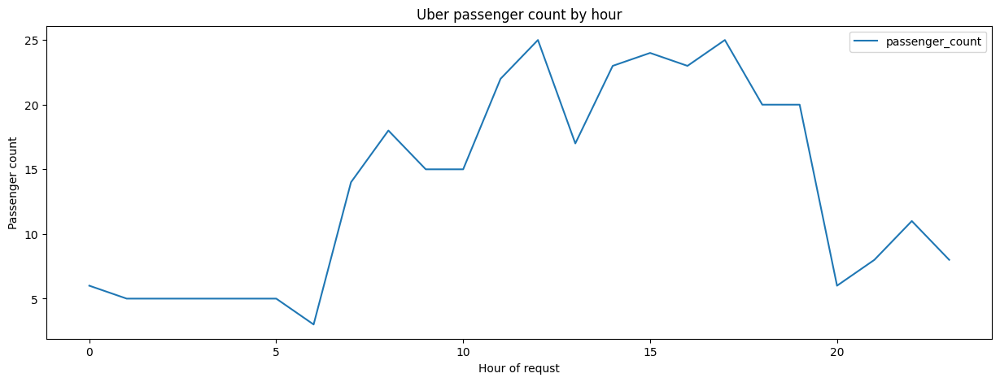

In [ ]:
# Test check of one day of data for one location
uber_trips = trips_data[(trips_data['request_date']=='2021-01-05')&(trips_data['PULocationID']==43)][['request_hour','passenger_count']]
uber_trips = uber_trips.groupby('request_hour').agg({'passenger_count':'sum'}).reset_index()

fig, ax = plt.subplots(figsize=(15, 5))
uber_trips.plot(x='request_hour', y='passenger_count', kind='line', ax=ax)
plt.xlabel("Hour of requst")
plt.ylabel("Passenger count")
plt.title("Uber passenger count by hour")
plt.show()

In [ ]:
 # Writing aggregated data to file
final_output_path = 'gs://dataprep-staging-a351fd7d-4575-4a19-86f3-a0e85c39fc88/nataliia.shcheglovaa@gmail.com/jobrun/Capstone_3_data/trips_data_final.csv'
trips_data.to_csv(final_output_path, storage_options={"token": "cloud"}, index=False, compression='gzip', chunksize=200000)
